# Project: **Advanced Lane Lines** 
***

The purpose of this project is to find curved lane lines with shadows and plenty of brightness as well as other obstacles (e.g. bridges) on the road from still images and video streams.

---

## Set up packages to use

Prior to this problem solving, I will import all required packages for a lane detection for both still images and video streams.

In [1]:
#import libraries to be used and set up for a plot inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob
#the following package is for unpacking and packing video streams
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

Imageio: 'ffmpeg.linux64' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg.linux64 (27.2 MB)
Downloading: 8192/28549024 bytes (0.01785856/28549024 bytes (6.3%4120576/28549024 bytes (14.46660096/28549024 bytes (23.39043968/28549024 bytes (31.711698176/28549024 bytes (41.0%14336000/28549024 bytes (50.2%17104896/28549024 bytes (59.9%19775488/28549024 bytes (69.3%22380544/28549024 bytes (78.4%25001984/28549024 bytes (87.6%27541504/28549024 bytes (96.5%28549024/28549024 bytes (100.0%)
  Done
File saved as /root/.imageio/ffmpeg/ffmpeg.linux64.


## Helper functions step by step

### Undistort images

Why find corners necessary?

In [2]:
def create_object_image_points(n_x, n_y):
    #using glob, make a list of calibration images under camera_cal directory (20 images)
    images = glob.glob('./camera_cal/calibration*.jpg')
    #initialise object points (anchor) and image points (distorted positions)
    obj_p = []
    img_p = []
    
    #define number of insdie corners in x and y - project specification is 9 by 6
    nx = n_x
    ny = n_y
    
    #define obj_points based on dimensions of 9 by 6
    #create obj_points with three channels and ny*nx dimensions
    obj_points = np.zeros((ny*nx, 3), np.float32)
    #then first two channels are populated through its coordinate position (x, y) 
    #through meshgrid transformed and reshaped to first two columns
    obj_points[:, :2] = np.mgrid[:nx, :ny].T.reshape(-1, 2)

    for file_name in images:
        #read in one image
        img = cv2.imread(file_name)
        #change colour to gray
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        #find the corners of chessboard 
        #https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#cv2.findChessboardCorners
        #to determine whether the input image is a view of the chessboard pattern 
        #and locate the internal chessboard corners. Parameters: image, corner dimension, corners, flags
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        #non zero value for 'ret' if all corners are found.
        if ret:
            #append found corners to img_p
            img_p.append(corners)
            #append anchor to obj_p
            obj_p.append(obj_points)
            #https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#cv2.drawChessboardCorners
            #draws individual chessboard corners detected either as red circles if the board was not found, 
            #or as colored corners connected with lines if the board was found.
            #patternWasFound parameter indicates that whether the complete board was found or not.
            cv2.drawChessboardCorners(img, (nx, ny), corners=corners, patternWasFound=ret)
    return img_p, obj_p

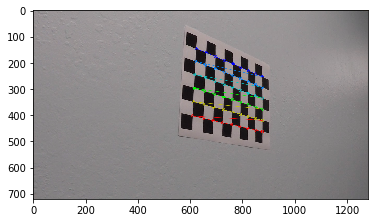

In [70]:
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)

In [3]:
def undistort_img(img, obj_points, img_points):
    #undistort an image using cv2.calibrateCamera() and cv2.undistort()
    #calibrate camera to generate camera matrix and distortion coefficient r
    img_shape = img.shape[:-1]
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, img_shape[::-1], None, None)
    #then using camera matrix and distortion coefficient, undistort the image
    #math formula is https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_calib3d/py_calibration/py_calibration.html
    undistorted_img = cv2.undistort(img, mtx, dist, None, mtx)

    return undistorted_img    

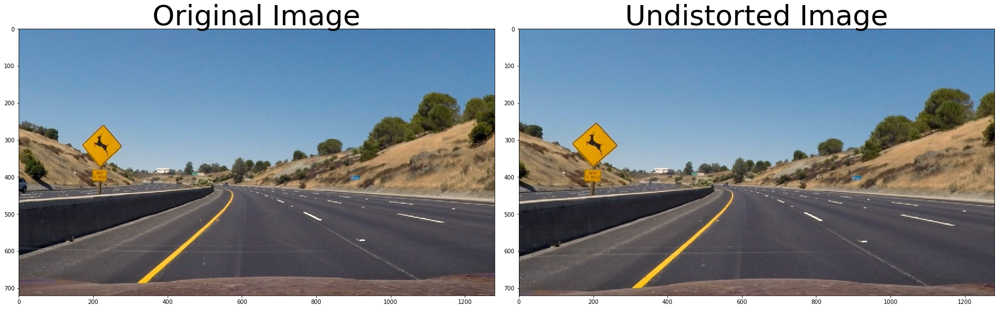

In [125]:
img = cv2.imread('test_images/test2.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
undistorted_image = undistort_img(img, obj_p, img_p)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
undistorted_image = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB)
ax2.imshow(undistorted_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Extract features through gradient thresholding

In [4]:
def find_sobel(img, orient='xy', sobel_k=3, thresh_min=0, thresh_max=255):
    '''This function is to identify and threshold x or y gradients.'''
    
    #https://docs.opencv.org/2.4/doc/tutorials/imgproc/imgtrans/sobel_derivatives/sobel_derivatives.html
    #orientation x highlights vertical lines
    if orient=='x':
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_k)
    #orientation y highlights horizontal lines
    if orient=='y':
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_k)

    #make it absolute value
    abs_sobel = np.absolute(sobel)
    
    #scale abs_sobel based on max value into 8-bit unsigned integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    #create a mask
    binary_output = np.zeros_like(scaled_sobel)
    
    #create binary_output with "AND" operations
    binary_output[(scaled_sobel>=thresh_min) & (scaled_sobel<=thresh_max)]=1
    
    return binary_output

It is time to identify a magnitude of gradients by combining x and y orientation together

In [5]:
def find_magnitude(img, sobel_k=3, thresh_min=0, thresh_max=255):
    '''This function is to identify and threshold a magnitude of gradients for both x and y direction.'''  
    
    #apply cv2.Sobel() - sobel kernel size can make a difference
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_k)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_k)
    
    #calculate absolute value with squaure root
    abs_sobel = np.sqrt(np.square(sobel_x) + np.square(sobel_y))
    
    #scale abs_sobel based on max value into 8-bit
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    #create a mask
    magnitude_output = np.zeros_like(scaled_sobel)
    
    #create binary_output with "AND" operations
    magnitude_output[(scaled_sobel>=thresh_min) & (scaled_sobel<=thresh_max)]=1
    
    return magnitude_output

sobel kernel size 19

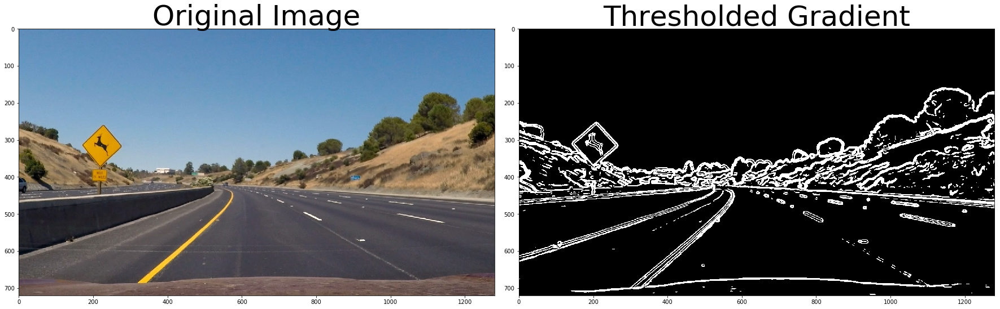

In [6]:
img = cv2.imread('test_images/test2.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(gray, obj_p, img_p)
sobel_image = find_magnitude(undistorted_image, 19, 40, 150)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sobel_image, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

sobel kernel size 3

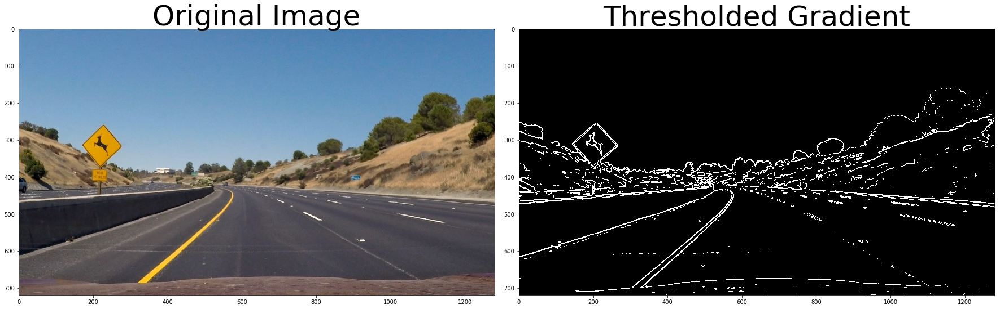

In [35]:
img = cv2.imread('test_images/test2.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(gray, obj_p, img_p)
sobel_image = find_magnitude(undistorted_image, 3, 40, 150)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sobel_image, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

A direction of gradients can be calculated through arctan.

In [6]:
def find_direction(img, sobel_k=3, thresh_min=0, thresh_max=np.pi/2):
    '''This function is to identify and thresold a direction of gradients.'''
    #calculate sobel_x and sobel_y to find the magnitude of gradients
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_k)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_k)
    #calculate aabsolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    #calculate the direction of the gradient using np.arctan2
    direction = np.arctan2(abs_sobel_y, abs_sobel_x)
    #create a mask
    binary_output = np.zeros_like(direction)
    #create binary_output with "AND" operation for the values between direction
    binary_output[(direction>=thresh_min) & (direction<=thresh_max)] = 1
    
    return binary_output

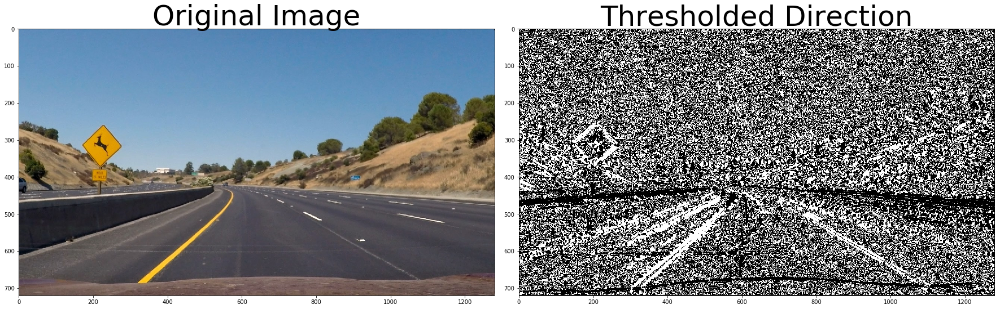

In [31]:
img = cv2.imread('test_images/test2.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(gray, obj_p, img_p)
sobel_image = transform_abs_sobel(undistorted_image, 'xy', 3, 40, 150)
dir_image = find_direction(undistorted_image, 13, thresh_min=0.7, thresh_max=1.3)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_image, cmap='gray')
ax2.set_title('Thresholded Direction', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Noisy but lanes are quite clear

In [7]:
def combine_threshold_gradients(x_gradients, y_gradients, magnitude, direction):
    combined_gradients = np.zeros_like(direction)
    combined_gradients[((x_gradients==1) & (y_gradients==1)) | ((magnitude==1) & (direction==1))] = 1
    
    return combined_gradients

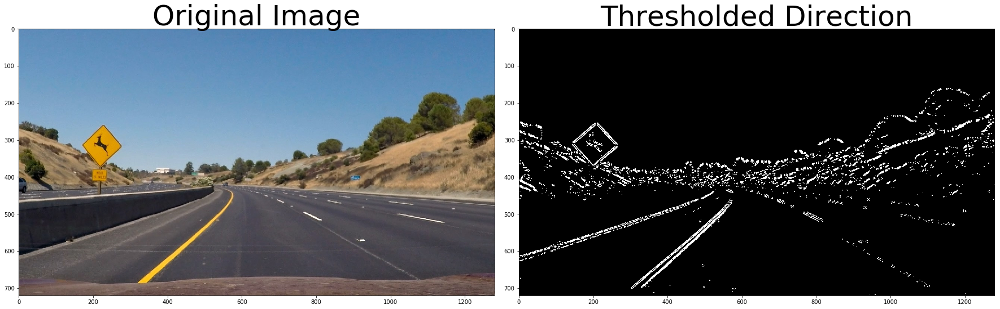

In [50]:
img = cv2.imread('test_images/test2.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(gray, obj_p, img_p)

t_min = 40
t_max = 150
s_k = 11
x_grad = find_sobel(undistorted_image, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined_threshold, cmap='gray')
ax2.set_title('Thresholded Direction', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Extract features through colour thresolding

I am selecting test image 5 as it has a large shade within the image to make a lane detection task difficult.

In [8]:
def find_rgb(img, chan='R', thresh_min=0, thresh_max=255):
    
    if chan=='R':
        #R channel is great for detecting white lanes
        ch = img[:, :, 2]
    if chan=='G':
        ch = img[:, :, 1]
    if chan=='B':
        ch = img[:, :, 0]
        
    binary_output_rgb = np.zeros_like(ch)
    binary_output_rgb[(ch >= thresh_min) & (ch <= thresh_max)] = 1
    
    return binary_output_rgb

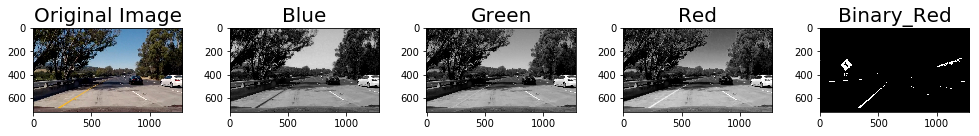

In [88]:
img = cv2.imread('test_images/test5.jpg')

#R channel is great for detecting white lanes
B = img[:, :, 0]
G = img[:, :, 1]
R = img[:, :, 2]

t_min = 200
t_max = 255

f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(13, 13))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(B, cmap='gray')
ax2.set_title('Blue', fontsize=20)
ax3.imshow(G, cmap='gray')
ax3.set_title('Green', fontsize=20)
ax4.imshow(R, cmap='gray')
ax4.set_title('Red', fontsize=20)
ax5.imshow(binary_output_rgb, cmap='gray')
ax5.set_title('Binary_Red', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

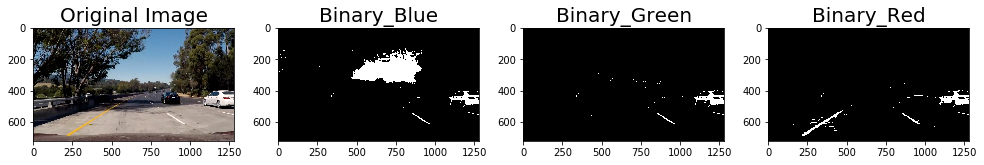

In [89]:
img = cv2.imread('test_images/test5.jpg')

t_min = 200
t_max = 255
B = find_rgb(img, 'B', 200, 255)
G = find_rgb(img, 'G', 200, 255)
R = find_rgb(img, 'R', 200, 255)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(13, 13))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(B, cmap='gray')
ax2.set_title('Binary_Blue', fontsize=20)
ax3.imshow(G, cmap='gray')
ax3.set_title('Binary_Green', fontsize=20)
ax4.imshow(R, cmap='gray')
ax4.set_title('Binary_Red', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [9]:
def find_hls(img, chan='S', thresh_min=0, thresh_max=255):
    
    hls_img = cv2.cvtColor(img,cv2.COLOR_BGR2HLS)
    
    if chan=='H':
        ch = hls_img[:, :, 0]
    if chan=='L':
        ch = hls_img[:, :, 1]
    #S channel is great for detecting both white and yellow lanes
    if chan=='S':
        ch = hls_img[:, :, 2]
        
    binary_output_hls = np.zeros_like(ch)
    binary_output_hls[(ch >= thresh_min) & (ch <= thresh_max)] = 1
    
    return binary_output_hls

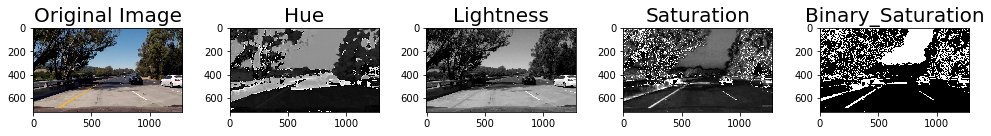

In [11]:
img = cv2.imread('test_images/test5.jpg')
hls_img = cv2.cvtColor(img,cv2.COLOR_BGR2HLS)

#S channel is great for detecting yellow lanes
H = hls_img[:, :, 0]
L = hls_img[:, :, 1]
S = hls_img[:, :, 2]

t_min = 90 #15 H
t_max = 255 #100 H

binary_output_hls = np.zeros_like(S)
binary_output_hls[( S >= t_min) & (S <= t_max)] = 1

f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(13, 13))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(H, cmap='gray')
ax2.set_title('Hue', fontsize=20)
ax3.imshow(L, cmap='gray')
ax3.set_title('Lightness', fontsize=20)
ax4.imshow(S, cmap='gray')
ax4.set_title('Saturation', fontsize=20)
ax5.imshow(binary_output_hls, cmap='gray')
ax5.set_title('Binary_Saturation', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

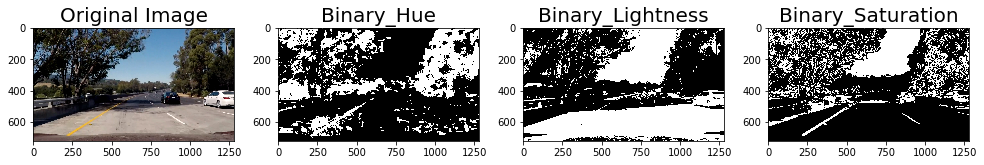

In [15]:
img = cv2.imread('test_images/test5.jpg')

t_min = 90 #15 H
t_max = 255 #100 H

H = find_hls(img, 'H', 15, 100)
L = find_hls(img, 'L', t_min, t_max)
S = find_hls(img, 'S', t_min, t_max)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(13, 13))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(H, cmap='gray')
ax2.set_title('Binary_Hue', fontsize=20)
ax3.imshow(L, cmap='gray')
ax3.set_title('Binary_Lightness', fontsize=20)
ax4.imshow(S, cmap='gray')
ax4.set_title('Binary_Saturation', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [10]:
def combine_threshold_colour(col1, col2):
    combined_colour = np.zeros_like(col1)
    combined_colour[(col1==1) | (col2==1)] = 1
    
    return combined_colour

### Combining gradient and colour thresholding together

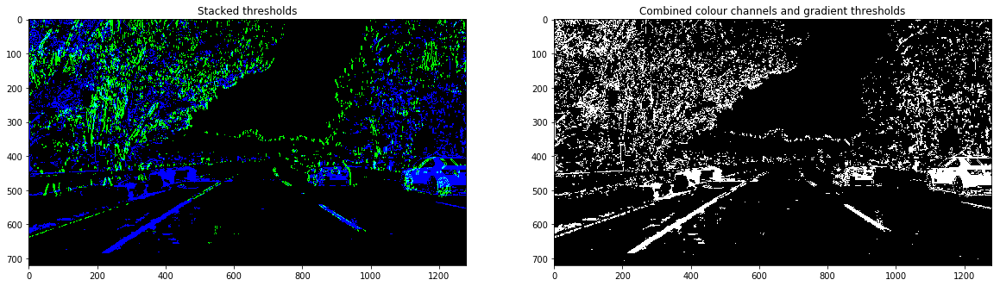

In [13]:
img = cv2.imread('test_images/test5.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(gray, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 11
x_grad = find_sobel(undistorted_image, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'R', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(grad_colour_binary)

ax2.set_title('Combined colour channels and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')

### Transform perspectives

I placed extra efforts to think about this section. I thought that the original process of looking at each image mannually to transform perspectives can be improved. Thus, I experimented how to get the correct identification of four source points of the current lane that the car is located in through utilising what we have learnt previously.

My goal is to identify four coordinates for the current lane algorithmically. Therefore, I used the process of identifying lanes through a region-of-interest mask, Hough transformation and interpolation methods.

In [11]:
def confine_roi(img, edges, margin):
    #1. create a mask background from the size of an image and make all pixels black (i.e. rgb 0)
    mask_background = np.zeros_like(edges)
    
    #2. get the size of an image and define vertices of region of interests
    img_shape = img.shape
    vertices = np.array([[(margin,img_shape[0]+margin),(img_shape[1]//2, img_shape[0]//2), (img_shape[1]-margin,img_shape[0]+margin)]], dtype=np.int32)
    
    #3. areas that are not masked (i.e. region of interest) are coloured white (255)
    #where there are more than 1 channel (e.g. RGB)
    if len(img_shape) > 2:
        channel_count = img_shape[2]
        not_mask_color = (255,) * channel_count
    else:
        not_mask_color = 255
        
    
    #4. cv2.fillPoly() fills an area bounded by several polygonal outlines with 1
    cv2.fillPoly(mask_background, vertices, not_mask_color)
    
    #5. bitwise_and finds an area where both pixel values are 1
    masked_edges = cv2.bitwise_and(edges, mask_background)
    
    return masked_edges

In [12]:
def connect_edges(edges, thres, min_len, max_gap):
    #1. define parameters for hough transform: rho, theta
    #distance
    rho = 2
    #angle
    theta = np.pi/180
    #minimum number of votes
    threshold = thres
    #minimum number of pixels making up a line
    min_line_length = min_len
    #maximum gap in pixels between connectable line segments
    max_line_gap = max_gap

    #2. connect dots and edges through hough line transform
    hough_lines = cv2.HoughLinesP(edges, rho, theta, threshold, np.array([]), min_line_length, max_line_gap)
    
    return hough_lines

In [13]:
def interpolate_lines(img, lines):
    #1. initialise empty arrays for left lane and right lane Xs and Ys
    left_lanes = []
    right_lanes = []
    
    #2. for all lines found by hough transformation, get slopes and intercepts
    for line in lines:
        x1, y1, x2, y2 = np.squeeze(line)
        #fit each line between two points (i.e. x1, y1 and x2, y2)
        p_slope, p_int = np.polyfit((x1, x2), (y1, y2), 1)

        #if the slope is forward slash, then takes it into right; otherwise left
        if p_slope < 0:
            left_lanes.append((p_slope, p_int))
        else:
            right_lanes.append((p_slope, p_int))
        
    #3. get median of collections of slopes and intercepts (in case the lines are skewed) to determine a single representative lane for each
    left_lanes_median = np.median(left_lanes, axis=0)
    right_lanes_median = np.median(right_lanes, axis=0)
#     print(left_lanes_median)
    return [left_lanes_median, right_lanes_median]

In [14]:
def get_xys(img_shape, lanes, margin):
    left_lanes = lanes[0]
    right_lanes = lanes[1]
    first_slope, first_int = left_lanes
    second_slope, second_int = right_lanes

    #3. get left lane xys through first slope and intercept
    left_y1 = img_shape[0]
    left_y2 = int(left_y1 - margin)
    left_x1 = int((left_y1 - first_int)/first_slope)
    left_x2 = int((left_y2 - first_int)/first_slope)

    #4. get right lane xys through second slope and intercept
    right_y1 = img_shape[0]
    right_y2 = int(right_y1 - margin)
    right_x1 = int((right_y1 - second_int)/second_slope)
    right_x2 = int((right_y2 - second_int)/second_slope)

    return [[left_x1, left_y1, left_x2, left_y2], [right_x1, right_y1, right_x2, right_y2]]

I don't really need to draw the lines along the trapezoidal shape, but visualisation always help to understand whether the process is working as intended. Therefore, I will draw the lines below.

In [15]:
def draw_lines(img, left_right_xys):
    #copy an image with zero initiations to draw lines on
    image_with_lines = np.zeros_like(img)
    img_shape = img.shape

    #going through each xys and draw a line between them for left and right lanes
    if left_right_xys is not None:
        for i in range(len(left_right_xys)):
            x1, y1, x2, y2 = left_right_xys[i]
            cv2.line(image_with_lines, (x1, y1), (x2, y2), (178, 0, 255), 5)
    return image_with_lines

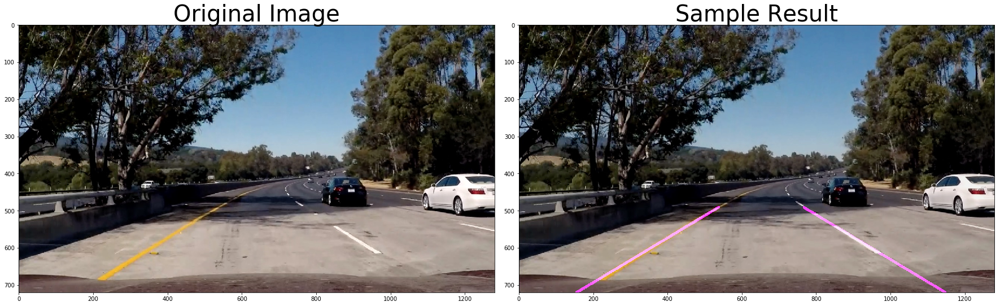

In [87]:
img = cv2.imread('test_images/test5.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(gray, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 11
x_grad = find_sobel(undistorted_image, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'R', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

#combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

#make binary into integer & scale to 8 bit (8bit unsigned integer) to pass into hough transformation with probability
combined_binary = np.uint8(combined_binary)
combined_binary_gray = np.dstack((combined_binary, combined_binary, combined_binary))*255
masked_edges = confine_roi(gray, combined_binary_gray, margin=60)
masked_edges = cv2.cvtColor(masked_edges,cv2.COLOR_BGR2GRAY)
median_lanes = interpolate_lines(img, hough_lines)
xys = get_xys(img.shape, median_lanes, margin=230)
connected_lines = draw_lines(img, xys)
#addWeighted src1, src1 weight, src2, src2 weight, bias
output_lines = cv2.addWeighted(img, 0.95, connected_lines, 5., 0.)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
fig.tight_layout()

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

output_lines = cv2.cvtColor(output_lines,cv2.COLOR_BGR2RGB)
ax2.imshow(output_lines)
ax2.set_title('Sample Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Based on a lane finding above, four points can be interpolated.

In [16]:
def find_source_points(img, combined_binary):

    combined_binary = np.uint8(combined_binary)
    combined_binary_gray = np.dstack((combined_binary, combined_binary, combined_binary))*255
    masked_edges = confine_roi(img, combined_binary_gray, margin=60)
    masked_edges = cv2.cvtColor(masked_edges,cv2.COLOR_BGR2GRAY)
    hough_lines = connect_edges(masked_edges, thres=50, min_len=100, max_gap=50)
    median_lanes = interpolate_lines(img, hough_lines)
    xys = get_xys(img.shape, median_lanes, margin=230)
    xys = np.concatenate(xys)
    
    left_bot_x, left_bot_y, left_top_x, left_top_y, right_bot_x, right_bot_y, right_top_x, right_top_y = xys
    src = np.float32([[left_top_x, left_top_y], [right_top_x, right_top_y], 
                      [right_bot_x, right_bot_y], [left_bot_x, left_bot_y]])
    return src

In [17]:
def find_dest_points(offset, img_size):
    dst = np.float32([[offset, 0],[img_size[0]-offset, 0],[img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    return dst

In [18]:
def transform_to_bird_eye_perspective(img, combined_binary):
    img_size = img.shape
    
    #define source points through hough transform and interpolation
    src = find_source_points(img, combined_binary)
    
    #define destination points
    offset = 150
    dst = find_dest_points(offset, img_size)
    
    #a perspective transform from four pairs of the corresponding points - returns perspective transform matrix
    p_matrix = cv2.getPerspectiveTransform(src, dst)
    p_matrix_inv = cv2.getPerspectiveTransform(dst, src)
    #transform perspective or warp to make an image from a bird eye view
    trsf_img = cv2.warpPerspective(img, p_matrix, img_size[:-1], flags=cv2.INTER_LINEAR)
    return trsf_img, p_matrix, p_matrix_inv

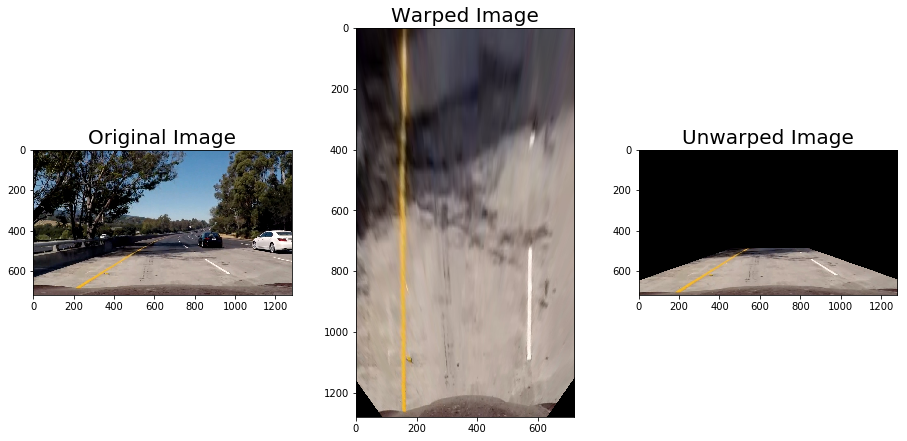

In [139]:
img = cv2.imread('test_images/test5.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 11
undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'R', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)
img_size = warped_image.shape
unwarped_image = cv2.warpPerspective(warped_image, M_inv, img_size[:-1] , flags=cv2.INTER_LINEAR)

#change colour BGR to RGB because of cv2
output_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB)
output_unwarped_image = cv2.cvtColor(unwarped_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 6))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(output_image)
ax2.set_title('Warped Image', fontsize=20)
ax3.imshow(output_unwarped_image)
ax3.set_title('Unwarped Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Find lines from the transformed image

To find left and right lanes systematically, I will go through four steps listed below:

In [19]:
def make_histogram(std_image):
    bottom_image = std_image[std_image.shape[0]//2:, ]
    histogram = np.sum(bottom_image, axis=0)
    
    return histogram

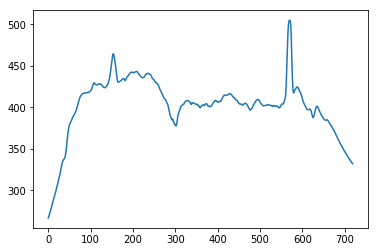

In [47]:
img = cv2.imread('test_images/test5.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 11
undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'R', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)
#make it to gray and normalise bewteen 0 and 1
std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255
histogram = make_histogram(std_image)
plt.plot(histogram)

In [20]:
def find_curved_lanes(image, histogram):
    #split histogram in the middle so that left and right lanes are distinguished
    split_mid = np.int(histogram.shape[0]//2)
    
    #to get left and right lanes estimated, only the index of the highest sum points (y position in this case) 
    #will be extracted
    left_x_est = np.argmax(histogram[:split_mid])
    right_x_est = np.argmax(histogram[split_mid:])+split_mid
    
    #number of windows to slide
    n_win = 10
    margin = 100
    min_pix_thres = 50
    
    #height of a window
    h_win = np.int(image.shape[0]//n_win)
    #indices for presence of binary 1s
    presence = image.nonzero()
    presence_y = np.array(presence[0])
    presence_x = np.array(presence[1])
    
    #initialise current x's position for left and right lane (in general, mean of the pixels)
    left_x_current = left_x_est
    right_x_current = right_x_est
    
    #when sufficient lane presence is found, the indices of their position will be stored here:
    left_x_inds = []
    right_x_inds = []
    
    for window in range(n_win):
        #define window boundary
        #top coordinates
        win_y_top = image.shape[0] - window*h_win
        win_x_left_top = left_x_current + margin
        win_x_right_top = right_x_current + margin
        #bottom coordinates
        win_y_bot = image.shape[0] - (window+1)*h_win
        win_x_left_bot = left_x_current - margin
        win_x_right_bot = right_x_current - margin
        
        out_img = np.dstack((image, image, image))
        #this step is not essential but for visualisation of windows
        cv2.rectangle(out_img,(win_x_left_bot,win_y_bot), (win_x_left_top,win_y_top),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_x_right_bot,win_y_bot), (win_x_right_top,win_y_top),(0,255,0), 2) 

        #identify pixels (indices) with 1s so that we can decide whether it is part of lanes
        good_left_inds = ((presence_y >= win_y_bot) & (presence_y < win_y_top) & 
        (presence_x >= win_x_left_bot) &  (presence_x < win_x_left_top)).nonzero()[0]
        good_right_inds = ((presence_y >= win_y_bot) & (presence_y < win_y_top) & 
        (presence_x >= win_x_right_bot) &  (presence_x < win_x_right_top)).nonzero()[0]
        
        #add this to the initialised list
        left_x_inds.append(good_left_inds)
        right_x_inds.append(good_right_inds)
        
        #check whether this indices meet the minimum threshold and 
        #if so, the mean point of these indices will be a new center for left and right lanes.
        if len(good_left_inds) > min_pix_thres:
            left_x_current = np.int(np.mean(presence_x[good_left_inds]))
        if len(good_right_inds) > min_pix_thres:
            right_x_current = np.int(np.mean(presence_x[good_right_inds]))
            
    #concatenate indices to make it to a list
    try:
        left_x_inds = np.concatenate(left_x_inds)
        right_x_inds = np.concatenate(right_x_inds)
    except ValueError:
        pass

    # Extract left and right line pixel positions
    left_x = presence_x[left_x_inds]
    left_y = presence_y[left_x_inds] 
    right_x = presence_x[right_x_inds]
    right_y = presence_y[right_x_inds]

    return [left_x, left_y, right_x, right_y, out_img]

In [21]:
def draw_lines_poly(points_and_img):
    #find x and y coordinates for left and right lanes
    left_x, left_y, right_x, right_y, out_img = points_and_img

    #fit a curved line for each lane through second order polinomial
    left_fit = np.polyfit(left_y, left_x, 2)
    right_fit = np.polyfit(right_y, right_x, 2)

    #for the plotting purpose, I will generate random points through the curved lines above
    #generate the number of y coordinates via np.linspace
    random_y = np.linspace(0, out_img.shape[0]-1, out_img.shape[0])
    #because the lanes were defined through y coordinates, fit it through ay^2+by+c
    try:
        left_fit_x = left_fit[0]*random_y**2 + left_fit[1]*random_y + left_fit[2]
        right_fit_x = right_fit[0]*random_y**2 + right_fit[1]*random_y + right_fit[2]
    except TypeError:
        #if there is an error, linear lines are drawn
        print("Error occured during fitting lines.")
        left_fit_x = 1*random_y**2 + 1*random_y
        right_fit_x = 1*random_y**2 + 1*random_y

    #left lane - magenta, right lane - teal
    out_img[left_y, left_x] = [178, 0, 255]
    out_img[right_y, right_x] = [0, 128, 128]

    # Plots the left and right polynomials on the lane lines
#     plt.plot(left_fit_x, random_y, color='black')
#     plt.plot(right_fit_x, random_y, color='black')

    return left_fit_x, right_fit_x, out_img

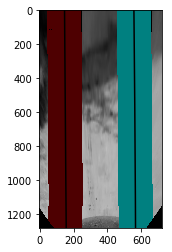

In [100]:
img = cv2.imread('test_images/test5.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 11
undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'R', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1
warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)
#make it to gray and normalise bewteen 0 and 1
std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255
histogram = make_histogram(std_image)
points_img = find_curved_lanes(std_image, histogram)
left_fit_x, right_fit_x, output_image = draw_lines_poly(points_img)
plt.imshow(output_image)

### Measuring curvature

In [22]:
def measure_curvature(image, left_x_values, right_x_values):
    #estimate conversions in x and y from pixel space to meters
    y_dim = 720
    y_real = 8
    x_dim = 700
    x_real = 3.7
    y_per_pixel = y_real/y_dim
    x_per_pixel = x_real/x_dim
    
    #get max value of ys so that
    random_y = np.linspace(0, image.shape[0]-1, image.shape[0])
    y_eval = np.max(random_y)
    
    left_fit_cr = np.polyfit(random_y*y_per_pixel, left_x_values*x_per_pixel, 2)
    right_fit_cr = np.polyfit(random_y*y_per_pixel, right_x_values*x_per_pixel, 2)
    
    left_curve = ((1+(2*left_fit_cr[0]*y_eval*y_per_pixel+left_fit_cr[1])**2)**(3/2))/np.absolute(2*left_fit_cr[0])
    right_curve = ((1+(2*right_fit_cr[0]*y_eval*y_per_pixel+right_fit_cr[1])**2)**(3/2))/np.absolute(2*right_fit_cr[0])
    
    return left_curve, right_curve

Radius of curvature: 11411.450192 m


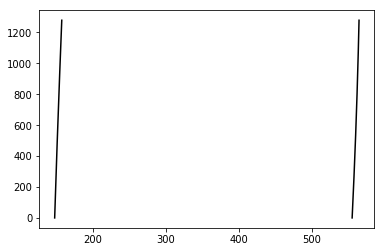

In [119]:
img = cv2.imread('test_images/test5.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 11
undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'R', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1
warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)
#make it to gray and normalise bewteen 0 and 1
std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255
histogram = make_histogram(std_image)
points_img = find_curved_lanes(std_image, histogram)
left_fit_x, right_fit_x, output_image = draw_lines_poly(points_img)
left_curve, right_curve = measure_curvature(out_img, left_fit_x, right_fit_x)
mean_curve = (left_curve+right_curve)/2
print("Radius of curvature: %f m" % mean_curve)

## Build the pipeline with helper functions and still image testing

In [23]:
def draw_lane_areas(org_img, warped_image, inv_matrix, left_fit_x, right_fit_x):
    #np.linspace returns evenly spaced numbers over a specified interval - start, stop, number of points
    random_y = np.linspace(0, warped_image.shape[0]-1, warped_image.shape[0])
    #np.vstack stacks arrays in sequence in a row-wise - e.g. left_fit_x and random_y are stacked sequentially
    left_lane = np.array(np.vstack([left_fit_x, random_y]).T)
    right_lane = np.array(np.flipud((np.vstack([right_fit_x, random_y]).T)))
    both_lanes = np.vstack((left_lane, right_lane))
    #fill the warped image with green colour of lane width
    cv2.fillPoly(warped_image, np.int_([both_lanes]), [117, 29, 168])
    #unwarped image with previous inverse transformation matrix
    img_size = warped_image.shape
    unwarped_image = cv2.warpPerspective(warped_image, inv_matrix, img_size[:-1] , flags=cv2.INTER_LINEAR)
    #add two images together
    output_image = cv2.addWeighted(org_img, 1, unwarped_image, 0.2, 0)

    return output_image

In [24]:
def save_result(output_image, img):
    #create a directory for saving outputs if the directory does not exist
    if not os.path.isdir('output_images'):
        os.mkdir('output_images')
    #define the directory path to save outputs
    path_to_save = os.path.join('output_images/', img)
    #write a resulting image
    cv2.imwrite(path_to_save, output_image)

In [25]:
def finding_curved_lanes_pipeline(path_to_img):
    #create image points and object points with chessboard to identify distortion distance
    img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
    for image in os.listdir(path_to_img):
        #read in image
        img = cv2.imread(os.path.join(path_to_img, image))
        #undistort the image
        undistorted_image = undistort_img(img, obj_p, img_p)

        #gradient thresholding
        t_min = 40
        t_max = 150
        s_k = 11
        undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
        x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
        y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
        mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
        dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

        combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

        #colour thresholding
        S = find_hls(img, 'S', 170, 255)
        R = find_rgb(img, 'R', 200, 255)

        combined_colour = combine_threshold_colour(S, R)

        #green-gradients, blue-colour
        grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

        #combine the two binary thresholds
        combined_binary = np.zeros_like(combined_gradients)
        combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1
        
        #make an image to a bird eye view
        warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)
        
        #make it to gray and normalise bewteen 0 and 1
        std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255
        #calculate bottom half of the image into histogram to roughly identify left and right lane position
        histogram = make_histogram(std_image)
        
        #find x and y positions of left and right lanes
        points_img = find_curved_lanes(std_image, histogram)
        #fit a polynomial line for left and right lane so that we can predict x positions
        left_fit_x, right_fit_x, output_image = draw_lines_poly(points_img)
        #measure left and right curvature
        left_curve, right_curve = measure_curvature(output_image, left_fit_x, right_fit_x)
        #get mean of the curvature
        mean_curve = (left_curve+right_curve)/2
        #draw the colored areas between identified lanes
        output_image = draw_lane_areas(img, warped_image, M_inv, left_fit_x, right_fit_x)
        
        #save output images
        save_result(output_image, image)
        
        #visualise the resulting images
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        fig.tight_layout()
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=40)
        
        output_image = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)
        ax2.imshow(output_image)
        ax2.set_title('Sample Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

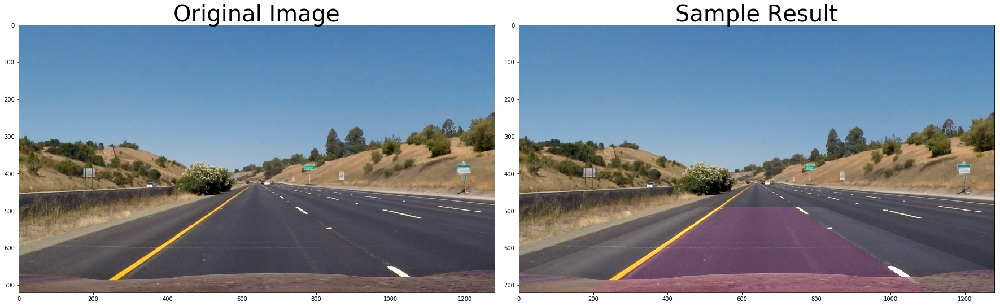

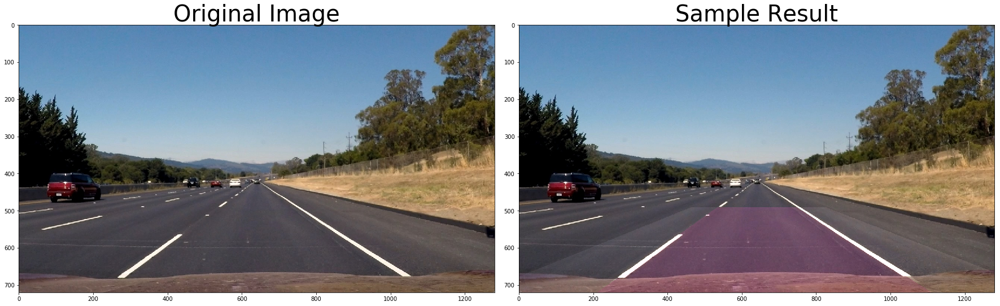

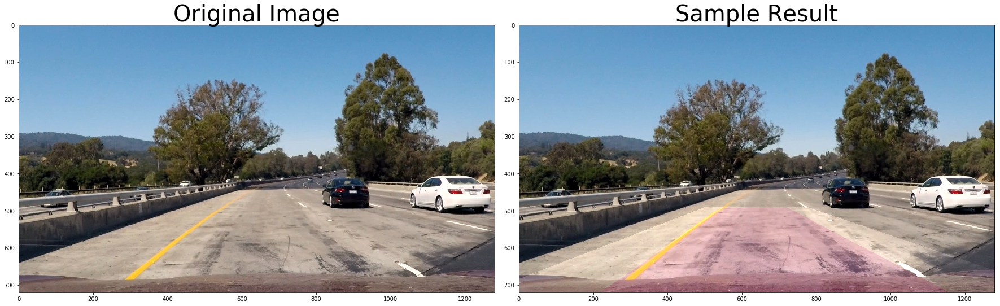

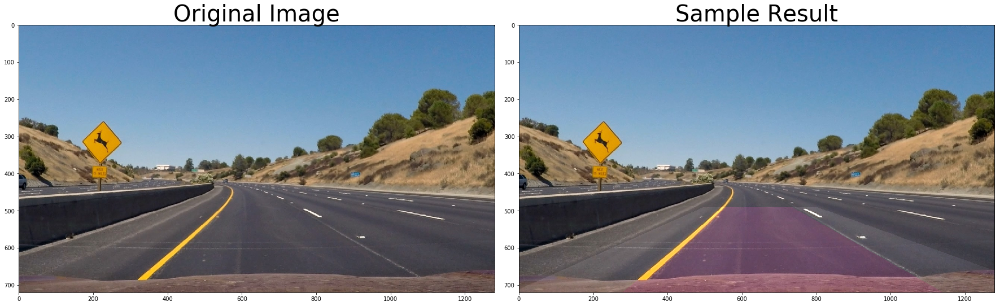

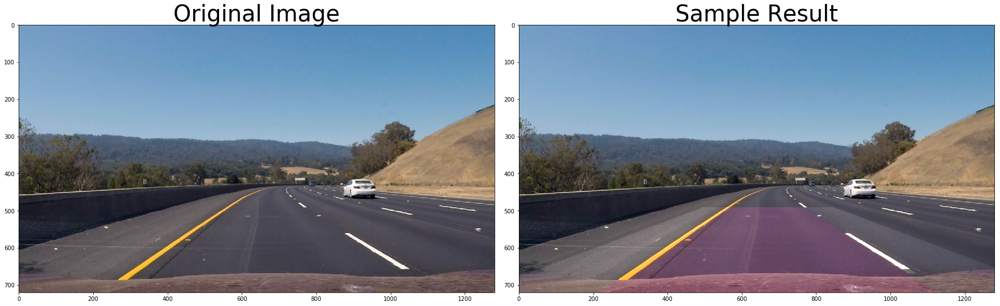

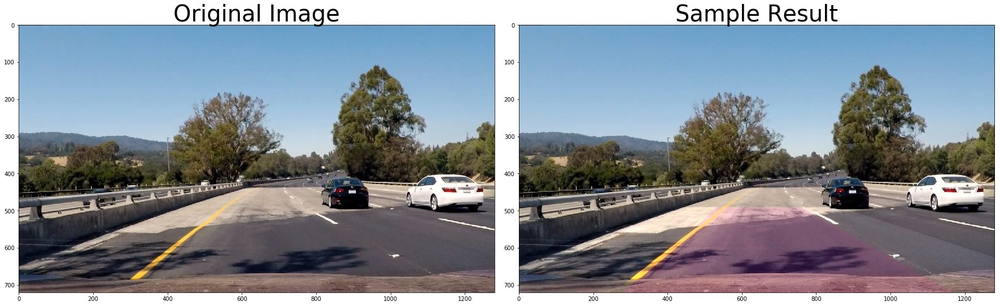

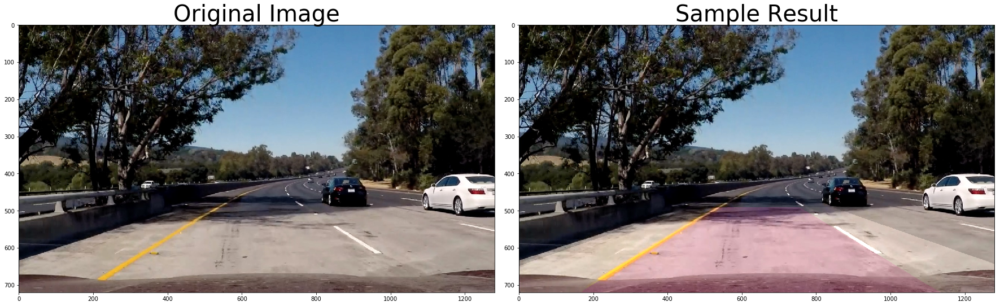

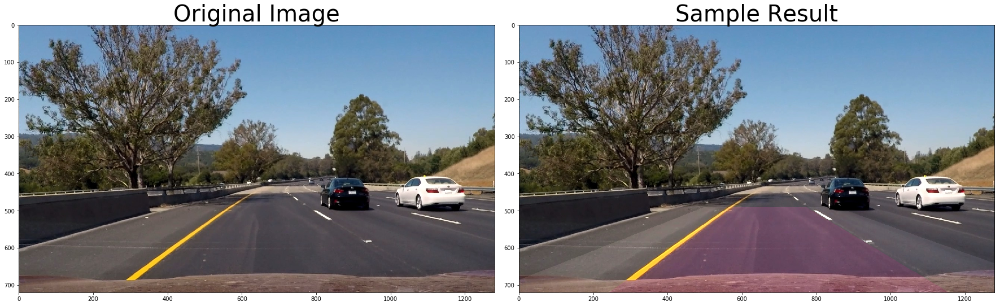

In [41]:
finding_curved_lanes_pipeline('test_images/')

## Video stream testing

### Limit the search on a next frame and average lanes
--------
Not ready from here

For video streams, once the lanes from the first image capture are located, the information from this process can be used to identify the next frames of the same video.

In [ ]:
class LaneFindingVideo:
    def __init__(self, img):
        self.image = img
        #create image points and object points only once with chessboard to identify distortion distance
        self.img_p, self.obj_p = create_object_image_points(n_x=9, n_y=6)
        self.left_fit_x = None
        self.right_fit_x = None
        self.output_image = np.copy(img)
    
    def draw_lane_areas(org_img, warped_image, inv_matrix, left_fit_x, right_fit_x):
        #np.linspace returns evenly spaced numbers over a specified interval - start, stop, number of points
        random_y = np.linspace(0, warped_image.shape[0]-1, warped_image.shape[0])
        #np.vstack stacks arrays in sequence in a row-wise - e.g. left_fit_x and random_y are stacked sequentially
        left_lane = np.array(np.vstack([left_fit_x, random_y]).T)
        right_lane = np.array(np.flipud((np.vstack([right_fit_x, random_y]).T)))
        both_lanes = np.vstack((left_lane, right_lane))
        #fill the warped image with green colour of lane width
        cv2.fillPoly(warped_image, np.int_([both_lanes]), [117, 29, 168])
        #unwarped image with previous inverse transformation matrix
        img_size = warped_image.shape
        unwarped_image = cv2.warpPerspective(warped_image, inv_matrix, img_size[:-1] , flags=cv2.INTER_LINEAR)
        #add two images together
        output_image = cv2.addWeighted(org_img, 1, unwarped_image, 0.2, 0)

        return output_image
    
    def save_result(output_image, img):
        #create a directory for saving outputs if the directory does not exist
        if not os.path.isdir('output_images'):
            os.mkdir('output_images')
        #define the directory path to save outputs
        path_to_save = os.path.join('output_images/', img)
        #write a resulting image
        cv2.imwrite(path_to_save, output_image)
        
    def fit_lines_poly(self, points_and_img):
        #find x and y coordinates for left and right lanes
        left_x, left_y, right_x, right_y, out_img = points_and_img

        #fit a curved line for each lane through second order polinomial
        left_fit = np.polyfit(left_y, left_x, 2)
        right_fit = np.polyfit(right_y, right_x, 2)

        #for the plotting purpose, I will generate random points through the curved lines above
        #generate the number of y coordinates via np.linspace
        random_y = np.linspace(0, out_img.shape[0]-1, out_img.shape[0])
        #because the lanes were defined through y coordinates, fit it through ay^2+by+c
        try:
            left_fit_x = left_fit[0]*random_y**2 + left_fit[1]*random_y + left_fit[2]
            right_fit_x = right_fit[0]*random_y**2 + right_fit[1]*random_y + right_fit[2]
        except TypeError:
            #if there is an error, linear lines are drawn
            print("Error occured during fitting lines.")
            left_fit_x = 1*random_y**2 + 1*random_y
            right_fit_x = 1*random_y**2 + 1*random_y

        return left_fit_x, right_fit_x, random_y

    def average_lanes(self):
        #rejecting outliers
        
        #average with weighted 
        
    def limit_search(self, self.image):
        #margin of the search area
        margin = 100

        #indices for presence of binary 1s
        presence = image.nonzero()
        presence_y = np.array(presence[0])
        presence_x = np.array(presence[1])

        #define search area to be limited within polinomial lines +- margin
        left_lane_inds = (presence_x >= (left_fit[0]*presence_y**2+left_fit[1]*presence_y+left_fit[2]-margin)) 
        & (presence_x <= (left_fit[0]*presence_y**2+left_fit[1]*presence_y+left_fit[2]+margin))  
        right_lane_inds = (presence_x >= (right_fit[0]*presence_y**2+right_fit[1]*presence_y+right_fit[2]-margin)) 
        & (presence_x <= (right_fit[0]*presence_y**2+right_fit[1]*presence_y+right_fit[2]+margin))

        #get the position of these indices
        left_x = presence_x[left_lane_inds]
        left_y = presence_y[left_lane_inds] 
        right_x = presence_x[right_lane_inds]
        right_y = presence_y[right_lane_inds]

        #fit polynomial
        left_fit_x, right_fit_x, random_y = fit_poly(image.shape, left_x, left_y, right_x, right_y)

        #to display windows, create a frame
        out_img = np.dstack((image, image, image))*255
        window_img = np.zeros_like(out_img)
        #left lane - magenta, right lane - teal
        out_img[presence_y[left_lane_inds], presence_x[left_lane_inds]] = [178, 0, 255]
        out_img[presence_y[right_lane_inds], presence_x[right_lane_inds]] = [0, 128, 128]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

        # Plot the polynomial lines onto the image
        plt.plot(left_fit_x, random_y, color='black')
        plt.plot(right_fit_x, random_y, color='black')

        return output_image

    def process_image(self, img):
        #undistort the image
        undistorted_image = undistort_img(img, obj_p, img_p)

        #gradient thresholding
        t_min = 40
        t_max = 150
        s_k = 11
        undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
        x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
        y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
        mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
        dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

        combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

        #colour thresholding
        S = find_hls(img, 'S', 170, 255)
        R = find_rgb(img, 'R', 200, 255)

        combined_colour = combine_threshold_colour(S, R)

        #green-gradients, blue-colour
        grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

        #combine the two binary thresholds
        combined_binary = np.zeros_like(combined_gradients)
        combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

        #make an image to a bird eye view
        warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)

        #make it to gray and normalise bewteen 0 and 1
        std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255
        #calculate bottom half of the image into histogram to roughly identify left and right lane position
        histogram = make_histogram(std_image)

        #find x and y positions of left and right lanes
        points_img = find_curved_lanes(std_image, histogram)
        #fit a polynomial line for left and right lane so that we can predict x positions
        self.left_fit_x, self.right_fit_x, self.output_image = draw_lines_poly(points_img)
        #measure left and right curvature
        left_curve, right_curve = measure_curvature(output_image, left_fit_x, right_fit_x)
        #get mean of the curvature
        mean_curve = (left_curve+right_curve)/2
        #draw the colored areas between identified lanes
        output_image = draw_lane_areas(img, warped_image, M_inv, left_fit_x, right_fit_x)

In [99]:
def find_lanes_on_test_videos(path_to_videos):
    for vdo in os.listdir(path_to_videos):
        if vdo=='challenge.mp4':
            #define a video stream to process and make it into many clips/images
            clip1 = VideoFileClip(path_to_videos+vdo)

            lane_class = LaneFindingVideo()

            #replace each clip of a video stream with the processed result through the pipeline
            processed_clip = clip1.fl_image(lane_class.process_image)

            #write each frame of output image into a video stream
            video_path_to_save = "test_videos_output/"+vdo
            %time processed_clip.write_videofile(video_path_to_save, audio=False)

In [ ]:
find_lanes_on_test_videos('test_videos/')